In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor

# Loading the Dataset

In [2]:
pd.set_option('display.max_rows', None)
try:
    fifa_data = pd.read_csv('C:/Users/tusha/Downloads/fifa21_male2.csv', low_memory=False)
    print("Dataset loaded successfully!")
except Exception as e:
    print(f"Error loading dataset: {e}")

Dataset loaded successfully!


# Checking the data types

In [3]:
fifa_data.dtypes

ID                    int64
Name                 object
Age                   int64
OVA                   int64
Nationality          object
Club                 object
BOV                   int64
BP                   object
Position             object
Player Photo         object
Club Logo            object
Flag Photo           object
POT                   int64
Team & Contract      object
Height               object
Weight               object
foot                 object
Growth                int64
Joined               object
Loan Date End        object
Value                object
Wage                 object
Release Clause       object
Contract             object
Attacking             int64
Crossing              int64
Finishing             int64
Heading Accuracy      int64
Short Passing         int64
Volleys             float64
Skill                 int64
Dribbling             int64
Curve               float64
FK Accuracy           int64
Long Passing          int64
Ball Control        

# Data Cleaning

In [4]:
def clean_data(data):
    # Drop irrelevant columns
    irrelevant_columns = ["Player Photo", "Flag Photo", "Club Logo"]
    data = data.drop(columns=irrelevant_columns, errors='ignore')

    # Fill missing values
    data.fillna({
        'Position': 'Unknown',
        'OVA': data['OVA'].median(),
        'POT': data['POT'].median(),
    }, inplace=True)

    # Convert numeric columns with mixed types
    numeric_columns = data.select_dtypes(include=['object']).columns
    for column in numeric_columns:
        data[column] = pd.to_numeric(data[column], errors='coerce')
    
    return data

fifa_cleaned = clean_data(fifa_data)

# Performing Exploratory Data Analysis

                  ID  Name           Age           OVA  Nationality  Club  \
count   17125.000000   0.0  17125.000000  17125.000000          0.0   0.0   
mean   219388.716204   NaN     25.272934     66.965022          NaN   NaN   
std     37499.197507   NaN      4.942665      6.864329          NaN   NaN   
min         2.000000   NaN     16.000000     38.000000          NaN   NaN   
25%    204082.000000   NaN     21.000000     62.000000          NaN   NaN   
50%    228961.000000   NaN     25.000000     67.000000          NaN   NaN   
75%    243911.000000   NaN     29.000000     72.000000          NaN   NaN   
max    259105.000000   NaN     53.000000     93.000000          NaN   NaN   

                BOV   BP  Position           POT  ...  CDM  RDM  RWB   LB  \
count  17125.000000  0.0       0.0  17125.000000  ...  0.0  0.0  0.0  0.0   
mean      67.900204  NaN       NaN     72.489810  ...  NaN  NaN  NaN  NaN   
std        6.637538  NaN       NaN      5.769949  ...  NaN  NaN  NaN  NaN  

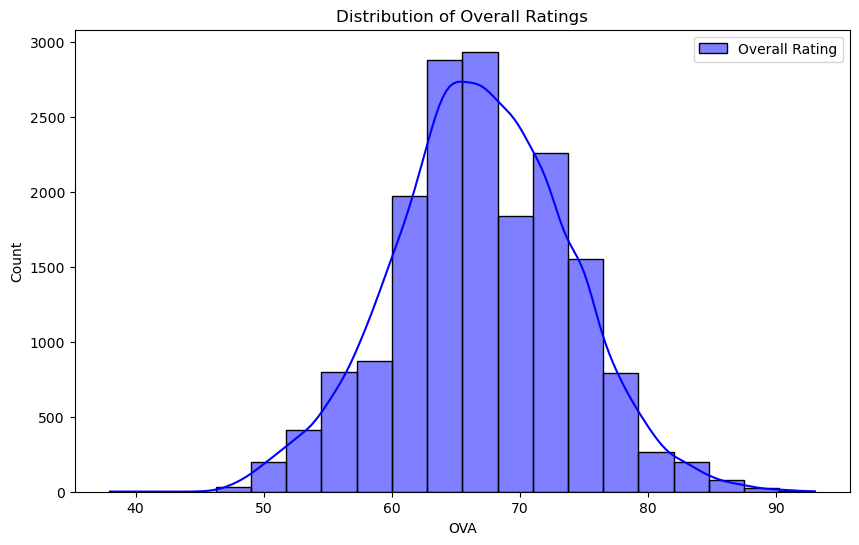

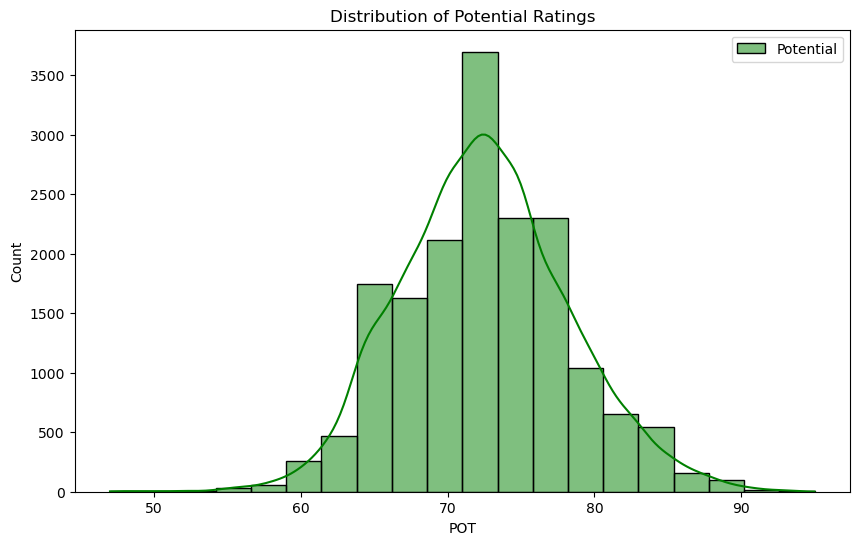

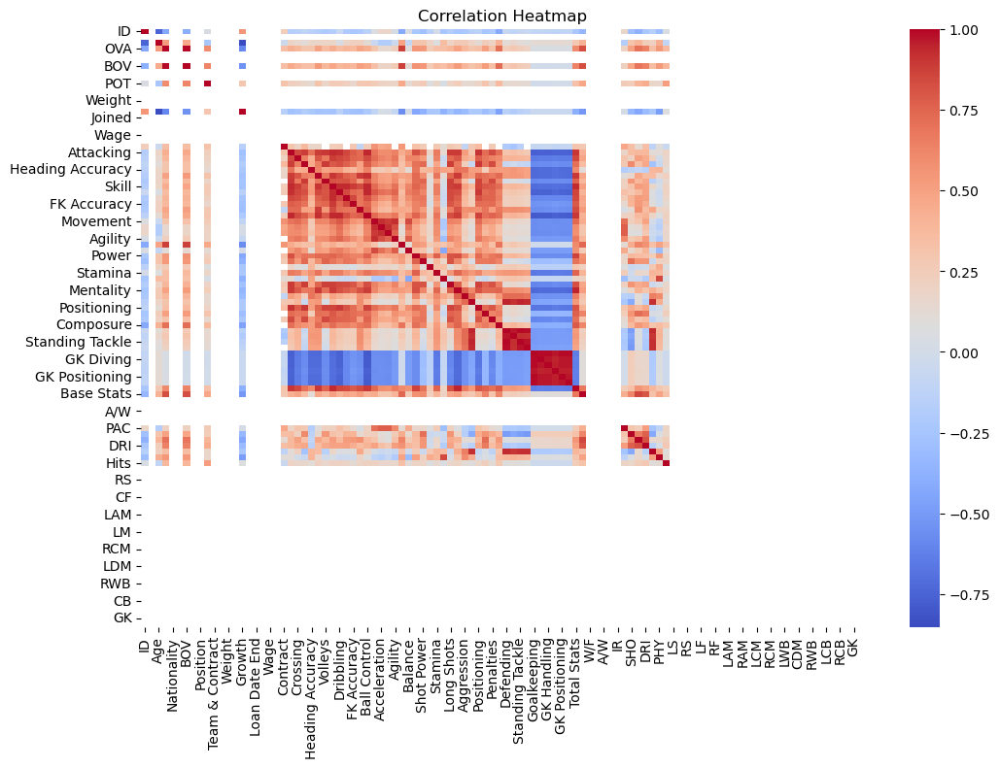

In [5]:
def perform_eda(data):
    # Summary Statistics
    print(data.describe())

    # Distribution Plots
    plt.figure(figsize=(10, 6))
    sns.histplot(data['OVA'], kde=True, bins=20, color='blue', label='Overall Rating')
    plt.title('Distribution of Overall Ratings')
    plt.legend()
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.histplot(data['POT'], kde=True, bins=20, color='green', label='Potential')
    plt.title('Distribution of Potential Ratings')
    plt.legend()
    plt.show()

    # Correlation Heatmap
    plt.figure(figsize=(12, 8))
    corr = data.corr()
    sns.heatmap(corr, cmap='coolwarm', annot=False)
    plt.title('Correlation Heatmap')
    plt.show()

perform_eda(fifa_cleaned)

# Height Vs Weight Variation of the players

In [6]:
props=fifa_data[['Name','Nationality','Club','Height','Weight']]
props['Ht in ft']=pd.to_numeric(props['Height'].str[0])
props['Ht in in']=pd.to_numeric(props['Height'].str.split("\'").str[1].str.strip('"'))
props['Height in cm']=(props['Ht in ft']*12+props['Ht in in'])*2.54
props['Weight in lb']=pd.to_numeric(props['Weight'].str.strip('lbs'))
fig=px.scatter(props,x='Weight in lb',y='Height in cm',color='Height in cm',size='Weight in lb',hover_data=['Name','Nationality','Club'],title='Height vs Weight Variation of the players in FIFA 21')
fig.show()

C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\1024433667.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  props['Ht in ft']=pd.to_numeric(props['Height'].str[0])
C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\1024433667.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  props['Ht in in']=pd.to_numeric(props['Height'].str.split("\'").str[1].str.strip('"'))
C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\1024433667.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice fr

# Position-wise Player counts

In [7]:
pos_cnt=fifa_data.groupby('BP').apply(lambda x:x['Name'].count()).reset_index(name='Counts')
pos_cnt.sort_values(by='Counts',ascending=False,inplace=True)
top_20_pos_cnt=pos_cnt[:20]
fig=px.bar(top_20_pos_cnt,x='BP',y='Counts',color='Counts',title='Positionwise Player counts in FIFA 21')
fig.show()

# Clustering Preparation

In [8]:
def prepare_clustering(data):
    # Select attributes for clustering and drop rows with missing values
    attributes = ['OVA', 'POT', 'Acceleration', 'Strength', 'Agility', 'Ball Control']
    clustering_data = data[attributes].dropna()

    # Perform K-Means clustering
    kmeans = KMeans(n_clusters=5, random_state=42)
    clustering_data['Cluster'] = kmeans.fit_predict(clustering_data)

    # Create a copy of the original data to avoid index mismatch
    clustered_data = data.copy()

    # Map clusters back to the original dataset where rows were not dropped
    clustered_data.loc[clustering_data.index, 'Cluster'] = clustering_data['Cluster']
    return clustered_data, kmeans

fifa_clustered, kmeans_model = prepare_clustering(fifa_cleaned)

C:\ProgramData\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



# Predictive Modeling: OVA

In [9]:
def train_player_ova_model(data):
    features = ['OVA', 'POT', 'Acceleration', 'Strength', 'Ball Control']
    target = 'OVA'

    data = data.dropna(subset=features + [target])
    X = data[features]
    y = data[target]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    model = RandomForestRegressor(random_state=42)
    model.fit(X_train, y_train)

    predictions = model.predict(X_test)
    mse = mean_squared_error(y_test, predictions)
    print(f'Player Potential Model MSE: {mse}')
    return model

player_ova_model = train_player_ova_model(fifa_cleaned)

Player Potential Model MSE: 1.6934306569343795e-05


# Age Vs Potential

In [10]:
cond_1=fifa_data['OVA']!=fifa_data['POT']
cond_2=fifa_data['Age']<25
fifa_fil=fifa_data[cond_1 & cond_2]
pot_play=fifa_fil[['Name','Age','Nationality','Club','POT','BP','OVA','Value','Release Clause']]
pot_play.sort_values(by='POT',ascending=False,inplace=True)
top_pot_play=pot_play[:50]
fig=px.scatter(pot_play,x='Age',y='POT',size='POT',color='Age',hover_data=['Name','Age','Nationality','BP','OVA','Value','Release Clause'],title='Age vs Maximum Potential Distribution of the young Players')
fig.show()

C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\2517306216.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Player count and Club Vs Potential

In [11]:
cnt_best_avg=fifa_data.groupby('Club').apply(lambda x:np.average(x['OVA'])).reset_index(name='Overall Ratings')
cnt_best_cnt=fifa_data.groupby('Club').apply(lambda x:x['OVA'].count()).reset_index(name='Player Counts')
snt_best_avg_cnt=pd.merge(cnt_best_avg,cnt_best_cnt,how='inner',left_on='Club',right_on='Club')
sel_best_avg_cnt=snt_best_avg_cnt[snt_best_avg_cnt['Player Counts']>=25]
sel_best_avg_cnt.sort_values(by=['Overall Ratings','Player Counts'],ascending=[False,False])
px.scatter(sel_best_avg_cnt,x='Overall Ratings',y='Player Counts',color='Player Counts',size='Overall Ratings',hover_data=['Club'],title='Clubwise player counts and Average Potential')

# Rating by postion and Top Performers (Top 10)

In [12]:
avg_rating_by_position = fifa_data.groupby('Position')['OVA'].mean().sort_values(ascending=False)
top_performers = fifa_data.sort_values(by='OVA', ascending=False).head(10)
print("Average overall rating by position:\n", avg_rating_by_position.head(10))
print("\nTop performers:\n", top_performers[['Name', 'OVA']])

Average overall rating by position:
 Position
LM RW LW        84.000000
ST RM CF        83.000000
RW RM CF        83.000000
CM RM ST        82.000000
CF LM LW        81.000000
CM RB LB        80.000000
CM CAM RW RM    80.000000
LW ST CM        80.000000
CF LW CAM       79.333333
CF ST CAM LW    79.000000
Name: OVA, dtype: float64

Top performers:
                    Name  OVA
752            L. Messi   93
142   Cristiano Ronaldo   92
2871       K. De Bruyne   91
2287     R. Lewandowski   91
2650          Neymar Jr   91
3665           J. Oblak   91
2790      M. ter Stegen   90
9331          K. Mbappé   90
5777            Alisson   90
4166        V. van Dijk   90


# Market Value and Wage of the players

In [18]:
cost_prop=fifa_data[['Name','Club','Nationality','Wage','Value','BP']]
cost_prop['MultW']=np.where(cost_prop.Wage.str[-1]=='K',1000,1)
cost_prop['Wage']=cost_prop.Wage.str.strip('K')
cost_prop['Wage']=cost_prop.Wage.str.strip('€')
cost_prop['Wage']=pd.to_numeric(cost_prop['Wage'])
cost_prop['Wage in €']=cost_prop['Wage']*cost_prop['MultW']
cost_prop['MultV']=np.where(cost_prop.Value.str[-1]=='K',1000,np.where(cost_prop.Value.str[-1]=='M',1000000,1))
cost_prop['Value']=cost_prop.Value.str.strip('€')
cost_prop['Value']=cost_prop.Value.str.strip('K')
cost_prop['Value']=cost_prop.Value.str.strip('M')
cost_prop['Value']=pd.to_numeric(cost_prop['Value'])
cost_prop['Value in €']=cost_prop['Value']*cost_prop['MultV']
fig=px.scatter(cost_prop,x='Value in €',y='Wage in €',color='Value in €',size='Wage in €',hover_data=['Name','Club','Nationality','BP'],title='Value vs Wage of all the Players')
fig.show()

C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\2822613189.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\2822613189.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\tusha\AppData\Local\Temp\ipykernel_26900\2822613189.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

# Game Attributes Vs Position

Overall Attributes of the Players in FIFA 21


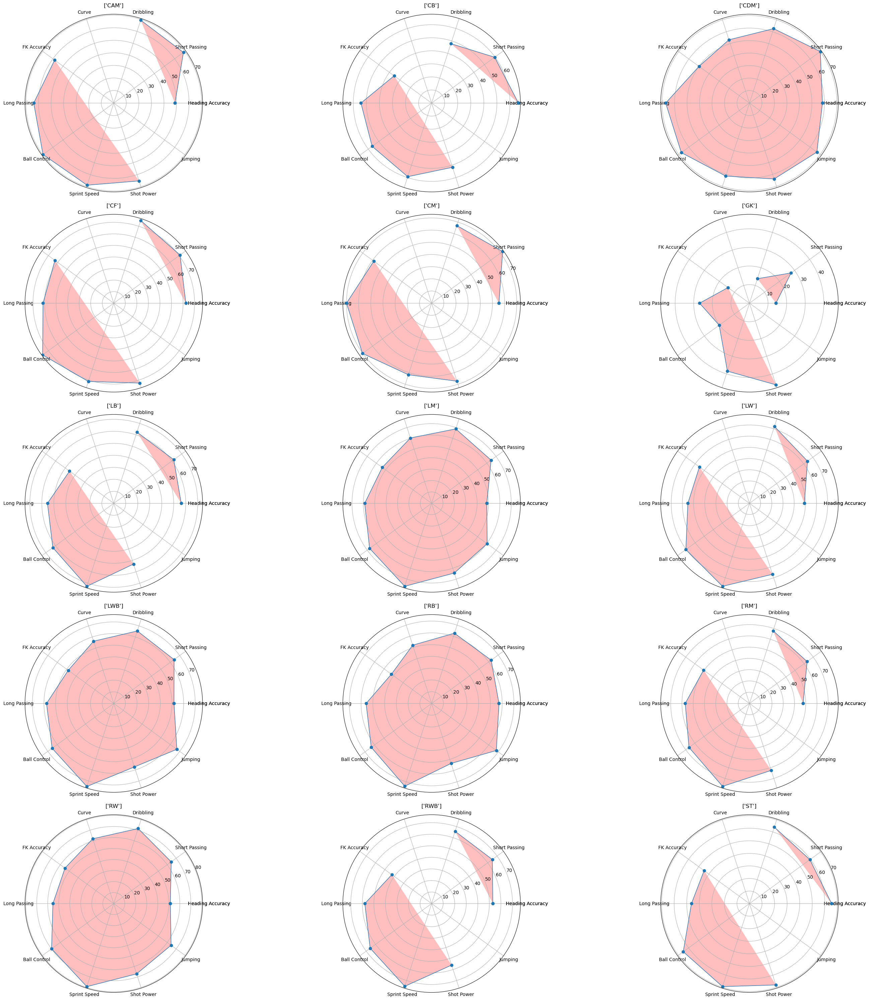

In [14]:
pos_head=fifa_data.groupby('BP').apply(lambda x:np.average(x['Heading Accuracy'])).reset_index(name='Heading Accuracy')
pos_sp=fifa_data.groupby('BP').apply(lambda x:np.average(x['Short Passing'])).reset_index(name='Short Passing')
pos_d=fifa_data.groupby('BP').apply(lambda x:np.average(x['Dribbling'])).reset_index(name='Dribbling')
pos_c=fifa_data.groupby('BP').apply(lambda x:np.average(x['Curve'])).reset_index(name='Curve')
pos_fk=fifa_data.groupby('BP').apply(lambda x:np.average(x['FK Accuracy'])).reset_index(name='FK Accuracy')
pos_lp=fifa_data.groupby('BP').apply(lambda x:np.average(x['Long Passing'])).reset_index(name='Long Passing')
pos_bc=fifa_data.groupby('BP').apply(lambda x:np.average(x['Ball Control'])).reset_index(name='Ball Control')
pos_ss=fifa_data.groupby('BP').apply(lambda x:np.average(x['Sprint Speed'])).reset_index(name='Sprint Speed')
pos_spo=fifa_data.groupby('BP').apply(lambda x:np.average(x['Shot Power'])).reset_index(name='Shot Power')
pos_jm=fifa_data.groupby('BP').apply(lambda x:np.average(x['Jumping'])).reset_index(name='Jumping')

pos_overall1=pd.merge(pos_head,pos_sp,how='inner',left_on='BP',right_on='BP')
pos_overall2=pd.merge(pos_d,pos_c,how='inner',left_on='BP',right_on='BP')
pos_overall3=pd.merge(pos_fk,pos_lp,how='inner',left_on='BP',right_on='BP')
pos_overall4=pd.merge(pos_bc,pos_ss,how='inner',left_on='BP',right_on='BP')
pos_overall5=pd.merge(pos_spo,pos_jm,how='inner',left_on='BP',right_on='BP')
pos_overall11=pd.merge(pos_overall1,pos_overall2,how='inner',left_on='BP',right_on='BP')
pos_overall22=pd.merge(pos_overall3,pos_overall4,how='inner',left_on='BP',right_on='BP')
pos_overall12=pd.merge(pos_overall11,pos_overall22,how='inner',left_on='BP',right_on='BP')
pos_overall=pd.merge(pos_overall12,pos_overall5,how='inner',left_on='BP',right_on='BP')
print('Overall Attributes of the Players in FIFA 21')
fig=plt.figure(figsize=(30,30))
for i in range(0,15):
    labels=np.array(['Heading Accuracy',
                     'Short Passing', 
                     'Dribbling', 
                     'Curve',
                     'FK Accuracy',
                     'Long Passing',
                     'Ball Control',
                     'Sprint Speed',
                     'Shot Power',
                     'Jumping'])
    stats=pos_overall.loc[i,labels].values

    # Compute angles for the radar chart and close the loop
    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False)
    stats = np.concatenate((stats, [stats[0]]))  # Close the plot by repeating the first value
    angles = np.concatenate((angles, [angles[0]]))  # Close the plot by repeating the first angle

    # Add the first label again to match the number of angles
    labels = np.concatenate((labels, [labels[0]]))

    ax = fig.add_subplot(5, 3, i + 1, polar=True)
    ax.plot(angles, stats, 'o-', linewidth=1)
    ax.fill(angles, stats, color='red', alpha=0.25)
    ax.set_thetagrids(angles * 180 / np.pi, labels)
    ax.set_title([pos_overall.loc[i, "BP"]])
    ax.grid(True)

plt.tight_layout()
plt.show()